<a href="https://colab.research.google.com/github/Preejababu/object_detection/blob/main/yolov5_wastesegregation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
#Mounting Gdrive
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [2]:

!pip install torch  #YOLOv5 runs on top of PyTorch, so we need to import it to the notebook

In [3]:
import torch # YOLOv5 implemented using pytorch

In [4]:
from IPython.display import Image #this is to render predictions


In [5]:
%cd /content/gdrive/MyDrive/Yolov5_waste_segregation
%ls

/content/gdrive/MyDrive/Yolov5_waste_segregation
data/       dataset_to_delete/        yolov5_wastesegregation.ipynb
data-copy/  tc-20220302T115934Z-001/
dataset/    yolov5/


In [ ]:
!git clone https://github.com/ultralytics/yolov5

Cloning into 'yolov5'...
remote: Enumerating objects: 11142, done.
remote: Total 11142 (delta 0), reused 0 (delta 0), pack-reused 11142
Receiving objects: 100% (11142/11142), 11.14 MiB | 7.29 MiB/s, done.
Resolving deltas: 100% (7699/7699), done.


In [6]:
pwd

'/content/gdrive/MyDrive/Yolov5_waste_segregation'

In [ ]:
#%cd ..

/content


In [ ]:
#!rm -rf yolov5

In [6]:
%cd yolov5

/content/gdrive/MyDrive/Yolov5_waste_segregation/yolov5


In [7]:
!pip install -r requirements.txt

     |████████████████████████████████| 596 kB 5.1 MB/s 
  Attempting uninstall: PyYAML
    Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13


# Divide the dataset in train and val folder. 

In [ ]:

import os
from random import choice
import shutil
'''
#arrays to store file names
imgs =[]
xmls =[]

#setup dir names
trainPath = '/content/gdrive/MyDrive/Yolov5_waste_segregation/dataset/images/train'

valPath = '/content/gdrive/MyDrive/Yolov5_waste_segregation/dataset/images/val'
crsPath = '/content/gdrive/MyDrive/Yolov5_waste_segregation/data/tc/' #dir where images and annotations stored

#setup ratio (val ratio = rest of the files in origin dir after splitting into train and test)
train_ratio = 0.8
val_ratio = 0.2


#total count of imgs
totalImgCount = len(os.listdir(crsPath))/2

#soring files to corresponding arrays
for (dirname, dirs, files) in os.walk(crsPath):
    for filename in files:
        if filename.endswith('.txt'):
            xmls.append(filename)
        else:
            imgs.append(filename)


#counting range for cycles
countForTrain = int(len(imgs)*train_ratio)
countForVal = int(len(imgs)*val_ratio)
print("training images are : ",countForTrain)
print("Validation images are : ",countForVal)
'''

'\n#arrays to store file names\nimgs =[]\nxmls =[]\n\n#setup dir names\ntrainPath = \'/content/gdrive/MyDrive/Yolov5_waste_segregation/dataset/images/train\'\n\nvalPath = \'/content/gdrive/MyDrive/Yolov5_waste_segregation/dataset/images/val\'\ncrsPath = \'/content/gdrive/MyDrive/Yolov5_waste_segregation/data/tc/\' #dir where images and annotations stored\n\n#setup ratio (val ratio = rest of the files in origin dir after splitting into train and test)\ntrain_ratio = 0.8\nval_ratio = 0.2\n\n\n#total count of imgs\ntotalImgCount = len(os.listdir(crsPath))/2\n\n#soring files to corresponding arrays\nfor (dirname, dirs, files) in os.walk(crsPath):\n    for filename in files:\n        if filename.endswith(\'.txt\'):\n            xmls.append(filename)\n        else:\n            imgs.append(filename)\n\n\n#counting range for cycles\ncountForTrain = int(len(imgs)*train_ratio)\ncountForVal = int(len(imgs)*val_ratio)\nprint("training images are : ",countForTrain)\nprint("Validation images are : 

In [8]:

trainimagePath = '/content/gdrive/MyDrive/Yolov5_waste_segregation/dataset/images/train'
trainlabelPath = '/content/gdrive/MyDrive/Yolov5_waste_segregation/labels/train'
valimagePath = '/content/gdrive/MyDrive/Yolov5_waste_segregation/dataset/images/val'
vallabelPath = '/content/gdrive/MyDrive/Yolov5_waste_segregation/dataset/labels/val'
'''
#cycle for train dir
for x in range(countForTrain):

    fileJpg = choice(imgs) # get name of random image from origin dir
    fileXml = fileJpg[:-10] +'.txt' # get name of corresponding annotation file

    #move both files into train dir
    #shutil.move(os.path.join(crsPath, fileJpg), os.path.join(trainimagePath, fileJpg))
    #shutil.move(os.path.join(crsPath, fileXml), os.path.join(trainlabelPath, fileXml))
    shutil.copy(os.path.join(crsPath, fileJpg), os.path.join(trainimagePath, fileJpg))
    shutil.copy(os.path.join(crsPath, fileXml), os.path.join(trainlabelPath, fileXml))


    #remove files from arrays
    imgs.remove(fileJpg)
    xmls.remove(fileXml)



#cycle for test dir   
for x in range(countForVal):

    fileJpg = choice(imgs) # get name of random image from origin dir
    fileXml = fileJpg[:-10] +'.txt' # get name of corresponding annotation file

    #move both files into train dir
    #shutil.move(os.path.join(crsPath, fileJpg), os.path.join(valimagePath, fileJpg))
    #shutil.move(os.path.join(crsPath, fileXml), os.path.join(vallabelPath, fileXml))
    shutil.copy(os.path.join(crsPath, fileJpg), os.path.join(valimagePath, fileJpg))
    shutil.copy(os.path.join(crsPath, fileXml), os.path.join(vallabelPath, fileXml))
    
    #remove files from arrays
    imgs.remove(fileJpg)
    xmls.remove(fileXml)

#rest of files will be validation files, so rename origin dir to val dir
#os.rename(crsPath, valPath)
shutil.move(crsPath, valPath) 


'''

"\n#cycle for train dir\nfor x in range(countForTrain):\n\n    fileJpg = choice(imgs) # get name of random image from origin dir\n    fileXml = fileJpg[:-10] +'.txt' # get name of corresponding annotation file\n\n    #move both files into train dir\n    #shutil.move(os.path.join(crsPath, fileJpg), os.path.join(trainimagePath, fileJpg))\n    #shutil.move(os.path.join(crsPath, fileXml), os.path.join(trainlabelPath, fileXml))\n    shutil.copy(os.path.join(crsPath, fileJpg), os.path.join(trainimagePath, fileJpg))\n    shutil.copy(os.path.join(crsPath, fileXml), os.path.join(trainlabelPath, fileXml))\n\n\n    #remove files from arrays\n    imgs.remove(fileJpg)\n    xmls.remove(fileXml)\n\n\n\n#cycle for test dir   \nfor x in range(countForVal):\n\n    fileJpg = choice(imgs) # get name of random image from origin dir\n    fileXml = fileJpg[:-10] +'.txt' # get name of corresponding annotation file\n\n    #move both files into train dir\n    #shutil.move(os.path.join(crsPath, fileJpg), os.path

In [ ]:
'''
trainimagePath = '/content/gdrive/MyDrive/Yolov5_waste_segregation/dataset/images/train'
trainlabelPath = '/content/gdrive/MyDrive/Yolov5_waste_segregation/labels/train'
valimagePath = '/content/gdrive/MyDrive/Yolov5_waste_segregation/dataset/images/val'
vallabelPath = '/content/gdrive/MyDrive/Yolov5_waste_segregation/dataset/labels/val'

#cycle for train dir
for x in range(countForTrain):

    fileJpg = choice(imgs) # get name of random image from origin dir
    fileXml = fileJpg[:-10] +'.txt' # get name of corresponding annotation file

    #move both files into train dir
    #shutil.move(os.path.join(crsPath, fileJpg), os.path.join(trainimagePath, fileJpg))
    #shutil.move(os.path.join(crsPath, fileXml), os.path.join(trainlabelPath, fileXml))
    shutil.copy(os.path.join(crsPath, fileJpg), os.path.join(trainimagePath, fileJpg))
    shutil.copy(os.path.join(crsPath, fileXml), os.path.join(trainlabelPath, fileXml))


    #remove files from arrays
    imgs.remove(fileJpg)
    xmls.remove(fileXml)



#cycle for test dir   
for x in range(countForVal):

    fileJpg = choice(imgs) # get name of random image from origin dir
    fileXml = fileJpg[:-10] +'.txt' # get name of corresponding annotation file

    #move both files into train dir
    #shutil.move(os.path.join(crsPath, fileJpg), os.path.join(valimagePath, fileJpg))
    #shutil.move(os.path.join(crsPath, fileXml), os.path.join(vallabelPath, fileXml))
    shutil.copy(os.path.join(crsPath, fileJpg), os.path.join(valimagePath, fileJpg))
    shutil.copy(os.path.join(crsPath, fileXml), os.path.join(vallabelPath, fileXml))
    
    #remove files from arrays
    imgs.remove(fileJpg)
    xmls.remove(fileXml)

#rest of files will be validation files, so rename origin dir to val dir
#os.rename(crsPath, valPath)
shutil.move(crsPath, valPath) 

'''


"\ntrainimagePath = '/content/gdrive/MyDrive/Yolov5_waste_segregation/dataset/images/train'\ntrainlabelPath = '/content/gdrive/MyDrive/Yolov5_waste_segregation/labels/train'\nvalimagePath = '/content/gdrive/MyDrive/Yolov5_waste_segregation/dataset/images/val'\nvallabelPath = '/content/gdrive/MyDrive/Yolov5_waste_segregation/dataset/labels/val'\n\n#cycle for train dir\nfor x in range(countForTrain):\n\n    fileJpg = choice(imgs) # get name of random image from origin dir\n    fileXml = fileJpg[:-10] +'.txt' # get name of corresponding annotation file\n\n    #move both files into train dir\n    #shutil.move(os.path.join(crsPath, fileJpg), os.path.join(trainimagePath, fileJpg))\n    #shutil.move(os.path.join(crsPath, fileXml), os.path.join(trainlabelPath, fileXml))\n    shutil.copy(os.path.join(crsPath, fileJpg), os.path.join(trainimagePath, fileJpg))\n    shutil.copy(os.path.join(crsPath, fileXml), os.path.join(trainlabelPath, fileXml))\n\n\n    #remove files from arrays\n    imgs.remove

In [ ]:

trainimagePath = '/content/gdrive/MyDrive/Yolov5_waste_segregation/dataset/images/train'
trainlabelPath = '/content/gdrive/MyDrive/Yolov5_waste_segregation/labels/train'
valimagePath = '/content/gdrive/MyDrive/Yolov5_waste_segregation/dataset/images/val'
vallabelPath = '/content/gdrive/MyDrive/Yolov5_waste_segregation/dataset/labels/val'
'''
#cycle for train dir
for x in range(countForTrain):

    fileJpg = choice(imgs) # get name of random image from origin dir
    fileXml = fileJpg[:-10] +'.txt' # get name of corresponding annotation file

    #move both files into train dir
    #shutil.move(os.path.join(crsPath, fileJpg), os.path.join(trainimagePath, fileJpg))
    #shutil.move(os.path.join(crsPath, fileXml), os.path.join(trainlabelPath, fileXml))
    shutil.copy(os.path.join(crsPath, fileJpg), os.path.join(trainimagePath, fileJpg))
    shutil.copy(os.path.join(crsPath, fileXml), os.path.join(trainlabelPath, fileXml))


    #remove files from arrays
    imgs.remove(fileJpg)
    xmls.remove(fileXml)



#cycle for test dir   
for x in range(countForVal):

    fileJpg = choice(imgs) # get name of random image from origin dir
    fileXml = fileJpg[:-10] +'.txt' # get name of corresponding annotation file

    #move both files into train dir
    #shutil.move(os.path.join(crsPath, fileJpg), os.path.join(valimagePath, fileJpg))
    #shutil.move(os.path.join(crsPath, fileXml), os.path.join(vallabelPath, fileXml))
    shutil.copy(os.path.join(crsPath, fileJpg), os.path.join(valimagePath, fileJpg))
    shutil.copy(os.path.join(crsPath, fileXml), os.path.join(vallabelPath, fileXml))
    
    #remove files from arrays
    imgs.remove(fileJpg)
    xmls.remove(fileXml)

#rest of files will be validation files, so rename origin dir to val dir
#os.rename(crsPath, valPath)
shutil.move(crsPath, valPath) 

'''


"\n#cycle for train dir\nfor x in range(countForTrain):\n\n    fileJpg = choice(imgs) # get name of random image from origin dir\n    fileXml = fileJpg[:-10] +'.txt' # get name of corresponding annotation file\n\n    #move both files into train dir\n    #shutil.move(os.path.join(crsPath, fileJpg), os.path.join(trainimagePath, fileJpg))\n    #shutil.move(os.path.join(crsPath, fileXml), os.path.join(trainlabelPath, fileXml))\n    shutil.copy(os.path.join(crsPath, fileJpg), os.path.join(trainimagePath, fileJpg))\n    shutil.copy(os.path.join(crsPath, fileXml), os.path.join(trainlabelPath, fileXml))\n\n\n    #remove files from arrays\n    imgs.remove(fileJpg)\n    xmls.remove(fileXml)\n\n\n\n#cycle for test dir   \nfor x in range(countForVal):\n\n    fileJpg = choice(imgs) # get name of random image from origin dir\n    fileXml = fileJpg[:-10] +'.txt' # get name of corresponding annotation file\n\n    #move both files into train dir\n    #shutil.move(os.path.join(crsPath, fileJpg), os.path

# Create dataset.yaml

### move the dataset’s dataset.yaml file to the /content/yolov5/data directory. 
### This file contains information required by YOLO to train the model on the custom data. 

![image.png](attachment:image.png)

In [10]:
!python train.py --img 415 --batch 16 --epochs 30 --data /content/gdrive/MyDrive/Yolov5_waste_segregation/dataset/dataset.yaml --weights yolov5s.pt --cache

train: weights=yolov5s.pt, cfg=, data=/content/gdrive/MyDrive/Yolov5_waste_segregation/dataset/dataset.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=30, batch_size=16, imgsz=415, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
Command 'git fetch && git config --get remote.origin.url' timed out after 5 seconds
YOLOv5 🚀 v6.1-11-g63ddb6f torch 1.10.0+cu111 CPU

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, hsv_h=0.015, hsv_s=0

## At the end of the training, two files should be saved in yolov5/runs/train/exp/weights: last.pt and best.pt. We’ll use best.pt.

## Explore the metrics recorded during training, I suggest you use TensorBoard, a very interactive exploration tool:

In [9]:
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

## Let’s explore now how confident our model is. We can plot a validation batch obtained during training and inspect the confidence score of each label

In [10]:
#Image(filename='runs/train/exp3/test_batch2_pred.jpg', width=1000)


FileNotFoundError: ignored

Training losses and performance metrics are also logged to Tensorboard and a custom results.txt logfile which is plotted as results.png (below) after training completes. 

You’ll be implementing the detect.py script with the best.pt weights and image dimensions of 416x416 pixels (it’s really important to comply with that). The results will be saved to runs/detect/exp. To display the results, run the following code:

In [13]:
#!python detect.py --source runs/train/exp/testimg.jpg --weights runs/train/exp/weights/best.pt --conf 0.25

!python detect.py --source runs/train/exp3/1.jpg --weights /content/gdrive/MyDrive/Yolov5_waste_segregation/yolov5/runs/train/exp3/weights/best.pt

detect: weights=['/content/gdrive/MyDrive/Yolov5_waste_segregation/yolov5/runs/train/exp3/weights/best.pt'], source=runs/train/exp3/1.jpg, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.1-11-g63ddb6f torch 1.10.0+cu111 CPU

Fusing layers... 
Model Summary: 213 layers, 7023610 parameters, 0 gradients, 15.8 GFLOPs
image 1/1 /content/gdrive/MyDrive/Yolov5_waste_segregation/yolov5/runs/train/exp3/1.jpg: 640x480 1 glass, 1 metal, 1 plastic, Done. (0.354s)
Speed: 2.0ms pre-process, 354.2ms inference, 27.8ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/detect/exp3


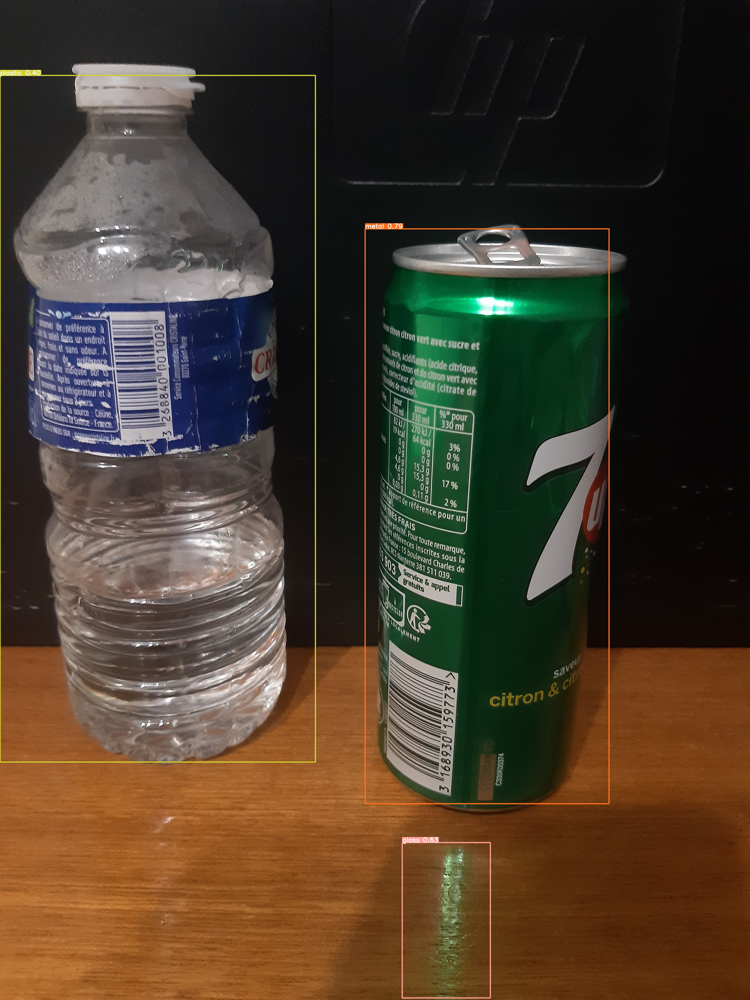

In [14]:
Image(filename='runs/detect/exp3/1.jpg', width=416)


In [16]:
from utils.plots import plot_results 
plot_results(save_dir='runs/train/exp3')  # plot results.txt as results.png